Section: 52740

Group Number: 10

Student Name: Haoliang Hu

Student UT EID: hh27683

Student Name: Alex Hoang

Student UT EID: agh2398

Student Name: Kelly To

Student UT EID: kt24854

Student Name: Daniel Miao

Student UT EID: dm52663

Date: 11/27/2023

# Introduction

#### Goal (or Thesis)
The project aims to delve into the activities occurring on Big Marketing’s networks over a two-week period, with a focus on proactive monitoring and analysis of any network events. The investigation will employ the scientific method, using observations from the data to form a hypothesis on patterns and anomalies occurring within Big Marketing’s network traffic. The end goal is to create a narrative that provides accurate and valuable insights for understanding network behavior, identifying potential issues, and informing future network management strategies.


#### Theories for each data set
Intrusion Protection System Data
* In the context of intrusion protection system (IPS) data, the primary objective is to enhance network security and safeguard against potential threats. This dataset offers a wealth of information that can be harnessed to detect and identify security threats, understand attack patterns, and improve incident response. By analyzing the IPS data, organizations can develop theories and hypotheses related to threat detection, anomaly identification, attack attribution, and the optimization of security policies and rules. This data also provides insights into the evolution of attack trends over time, enabling proactive measures to counter emerging threats. Furthermore, the dataset is valuable for assessing and mitigating vulnerabilities in the network, reducing false positive alerts, and detecting insider threats. Ultimately, the analysis of IPS data serves as a critical tool for maintaining a robust network security posture and safeguarding sensitive information from potential intrusions and attacks.

Network Flow Data
* This data might encompass potential insights into network traffic across time, revealing security incidents, any performance optimization of data breaches, or other attempted attacks compared to standard network communication patterns. This could identify bottlenecks, latency issues, or any leading indicators of data being compromised before the entire network is shut down. This could also detect any malware activity, the presence of viruses, unauthorized access patterns, and security incidents from unusual traffic patterns. Types of data and different devices/lines of communication and servers can be identified to locate the source of attacks compared to standard traffic. 

Network Health and Status Data (Big Brother data)
* Network health data can be used to assess and optimize network performance, contextualized with metrics such as response time, latency, and bandwidth utilization patterns over time. By analyzing resource usage data, you can optimize resource allocation to prevent resource shortages and system slowdowns. Network health data can be used to detect anomalies in system behavior, which may indicate system failures or security breaches. Predictive maintenance, service availability, and resource capacity are all variables that can be measured and analyzed for evidence or patterns of network vulnerability. 

# Data Wrangling

In [1]:
# Import common libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [57]:
# Import the network flow datasets for week 1
week1_nf_chunk1 = pd.read_csv('week1_nf_chunk1.csv')
week1_nf_chunk2 = pd.read_csv('week1_nf_chunk2.csv')
week1_nf_chunk3 = pd.read_csv('week1_nf_chunk3.csv')

# Concatenate the datasets
week1_nf = pd.concat([week1_nf_chunk1, week1_nf_chunk2, week1_nf_chunk3])

In [58]:
# Change parsedDate to datetime format
week1_nf['parsedDate'] = pd.to_datetime(week1_nf['parsedDate'])

# Change ipLayerProtocol, firstSeenSrcPort, and firstSeenDestPort to object (categorical) format since they are not really a count or something continuous
week1_nf['ipLayerProtocol'] = week1_nf['ipLayerProtocol'].astype('object')
week1_nf['firstSeenSrcPort'] = week1_nf['firstSeenSrcPort'].astype('object')
week1_nf['firstSeenDestPort'] = week1_nf['firstSeenDestPort'].astype('object')

In [4]:
# Import the big brother datasets for week 1
week1_bb = pd.read_csv('week1_bb.csv')

In [5]:
# Replace missing values from receivedfrom with 'unknown'
week1_bb['receivedfrom'] = week1_bb['receivedfrom'].fillna('unknown')
# Can't replace anything else because the other columns are missing due to the host not offering that service. 
# It won't make sense to replace it with anything else.

In [6]:
# Change parsedDate to datetime format
week1_bb['parsedDate'] = pd.to_datetime(week1_bb['parsedDate'])

# Change statusVal to object (categorical) format since it is not really a count or something continuous
week1_bb['statusVal'] = week1_bb['statusVal'].astype('object')

In [7]:
# Import the network flow datasets for week 2
week2_nf = pd.read_csv('week2_nf.csv')

In [8]:
# Replace parsedDate with datetime format
week2_nf['parsedDate'] = pd.to_datetime(week2_nf['parsedDate'])
# Replace ipLayerProtocol, firstSeenSrcPort, and firstSeenDestPort with object (categorical) format since they are not really a count or something continuous
week2_nf['ipLayerProtocol'] = week2_nf['ipLayerProtocol'].astype('object')

In [9]:
# Import the big brother datasets for week 2
week2_bb = pd.read_csv('week2_bb.csv')

In [10]:
# Replace missing values from receivedfrom with 'unknown'
week2_bb['receivedfrom'] = week2_bb['receivedfrom'].fillna('unknown')
# Can't replace anything else because the other columns are missing due to the host not offering that service.
# It won't make sense to replace it with anything else.

In [11]:
# Replace parsedDate with datetime format
week2_bb['parsedDate'] = pd.to_datetime(week2_bb['parsedDate'])

# Change statusVal to object (categorical) format since it is not really a count or something continuous
week2_bb['statusVal'] = week2_bb['statusVal'].astype('object')

In [12]:
# Import the ips datasets for week 2
week2_ips = pd.read_csv('week2_ips.csv')

/var/folders/03/7tjd273d5v3c9w_mbksz2h8r0000gn/T/ipykernel_10125/3147755954.py:2: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  week2_ips = pd.read_csv('week2_ips.csv')


In [13]:
# Replace dateTime with datetime format
week2_ips['dateTime'] = pd.to_datetime(week2_ips['dateTime'])
# Replace srcPort and destPort with object (categorical) format since they are not really a count or something continuous
week2_ips['srcPort'] = week2_ips['srcPort'].astype('object')
week2_ips['destPort'] = week2_ips['destPort'].astype('object')

# Analysis Using Network Flow and Big Brother Data

In [59]:
week1_nf.head()

,TimeSeconds,parsedDate,dateTimeStr,ipLayerProtocol,ipLayerProtocolCode,firstSeenSrcIp,firstSeenDestIp,firstSeenSrcPort,firstSeenDestPort,moreFragments,contFragments,durationSeconds,firstSeenSrcPayloadBytes,firstSeenDestPayloadBytes,firstSeenSrcTotalBytes,firstSeenDestTotalBytes,firstSeenSrcPacketCount,firstSeenDestPacketCount,recordForceOut
0,1.364803e+09,2013-04-01 07:50:16,2.013040e+13,17,UDP,172.20.0.3,172.255.255.255,137,137,0,0,29,600,0,1104,0,12,0,0
1,1.364803e+09,2013-04-01 07:50:21,2.013040e+13,17,UDP,172.10.0.40,172.255.255.255,137,137,0,0,0,100,0,184,0,2,0,0
2,1.364804e+09,2013-04-01 08:05:00,2.013040e+13,6,TCP,172.10.1.17,10.0.0.13,5040,80,0,0,0,176,409,454,633,5,4,0
3,1.364804e+09,2013-04-01 08:05:01,2.013040e+13,6,TCP,172.10.1.9,10.1.0.77,5067,80,0,0,0,176,409,454,633,5,4,0
4,1.364804e+09,2013-04-01 08:05:01,2.013040e+13,6,TCP,172.30.2.114,10.0.0.9,8749,80,0,0,0,175,408,453,632,5,4,0


In [66]:
# Look at the freqeuncy (will select the top 10) of source IPs each day and hour in week 1
week1_source_ip_freq = week1_nf.groupby([pd.Grouper(key='parsedDate', freq='H'), 'firstSeenSrcIp']).size().groupby(level=0, group_keys=False).nlargest(10).reset_index(name='counts')

# Graph the data in week1_source_ip_freq
fig = px.bar(week1_source_ip_freq, x='parsedDate', y='counts', color='firstSeenSrcIp', hover_data=['parsedDate', 'counts'])
# Create a title
fig.update_layout(title_text='Frequency of Top 10 Source IPs each hour in NF for week 1')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



We can see there is a sudden increase in the number of source IPs on April 2, 2013 from 5 AM to 6 AM, and on April 3, 2013 from 9 to 10 AM, showing potential DDoS attacks.

In [67]:
# Look at the freqeuncy of destination IPs each day in week 1
week1_dest_ip_freq = week1_nf.groupby([pd.Grouper(key='parsedDate', freq='H'), 'firstSeenDestIp']).size().groupby(level=0, group_keys=False).nlargest(10).reset_index(name='counts')

# Graph the data in week1_dest_ip_freq
fig = px.bar(week1_dest_ip_freq, x='parsedDate', y='counts', color='firstSeenDestIp', hover_data=['parsedDate', 'counts'])
# Create a title
fig.update_layout(title_text='Frequency of Top 10 Destination IPs each hour in NF for week 1')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



We can see there is also a sudden increase in the number of destination IPs on April 2, 2013 from 5 AM to 6 AM, and on April 3, 2013 from 9 to 10 AM, showing potential DDoS attacks.

In [117]:
# Filter to look only at source IP starting with 10, since that is the outside world IP prefix
# And destination IP starting with 172, since that is the firm's IP prefix
week1_inbound = week1_nf[(week1_nf['firstSeenSrcIp'].str.startswith('10')) & (week1_nf['firstSeenDestIp'].str.startswith('172'))]

# Check for port scanning by looking at the frequency of unique destination ports each hour in week 1
week1_dest_port_freq = week1_nf.groupby([pd.Grouper(key='parsedDate', freq='H')])['firstSeenDestPort'].nunique()

# Graph the data in week1_dest_port_freq
fig = px.bar(week1_dest_port_freq, x=week1_dest_port_freq.index, y='firstSeenDestPort', title='Number of Unique Destination Ports each hour in NF for week 1')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



We can see potential port scans on April 1 around 11 PM, 2013.

We can see potential port scans on April 2 from around 5 to 6 AM, 2013.

We can see potential port scans on April 3 around 9 to 11 AM, 2013.

We can see potential port scans on April 6 from around 11 AM to 12 PM, 2013.

We can see potential port scans on April 7 around 3 AM, 2013.

In [120]:
# Filter the week 1 big brother to include only rows with bbcontent contating 'Admin' 
week1_admin = week1_bb[week1_bb['bbcontent'].str.contains('Admin')]
week1_admin

,id,hostname,servicename,currenttime,statusVal,bbcontent,receivedfrom,diskUsagePercent,pageFileUsagePercent,numProcs,loadAveragePercent,physicalMemoryUsagePercent,connMade,parsedDate
0,36017,administrator.bigmkt1.com,cpu,1364832314,1,Mon Apr 01 08:05:11 PST 2013 [Administrator.B...,172.10.0.40,NaN,NaN,23.0,0.0,9.0,NaN,2013-04-01 09:05:14
23,38476,administrator.bigmkt1.com,cpu,1364832614,1,Mon Apr 01 08:10:10 PST 2013 [Administrator.B...,172.10.0.40,NaN,NaN,23.0,0.0,9.0,NaN,2013-04-01 09:10:14
45,42697,administrator.bigmkt1.com,cpu,1364833167,1,Mon Apr 01 08:19:33 PST 2013 [Administrator.B...,172.10.0.40,NaN,NaN,23.0,7.0,9.0,NaN,2013-04-01 09:19:27
85,109797,administrator.bigmkt1.com,cpu,1364842752,1,Mon Apr 01 10:59:10 PST 2013 [Administrator.B...,172.10.0.40,NaN,NaN,23.0,0.0,9.0,NaN,2013-04-01 11:59:12
110,113783,administrator.bigmkt1.com,cpu,1364843353,1,Mon Apr 01 11:09:11 PST 2013 [Administrator.B...,172.10.0.40,NaN,NaN,23.0,0.0,9.0,NaN,2013-04-01 12:09:13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3406323,1556497,administrator.bigmkt1.com,mem,1365041179,1,Wed Apr 03 18:06:17 PST 2013 [Administrator.B...,172.10.0.40,NaN,NaN,NaN,NaN,NaN,NaN,2013-04-03 19:06:19
3406741,1543897,administrator.bigmkt1.com,mem,1365039378,1,Wed Apr 03 17:36:17 PST 2013 [Administrator.B...,172.10.0.40,NaN,NaN,NaN,NaN,NaN,NaN,2013-04-03 18:36:18
3407125,1569062,administrator.bigmkt1.com,mem,1365042979,1,Wed Apr 03 18:36:17 PST 2013 [Administrator.B...,172.10.0.40,NaN,NaN,NaN,NaN,NaN,NaN,2013-04-03 19:36:19
3407219,1545886,administrator.bigmkt1.com,mem,1365039678,1,Wed Apr 03 17:41:17 PST 2013 [Administrator.B...,172.10.1.252,NaN,NaN,NaN,NaN,NaN,NaN,2013-04-03 18:41:18


In [123]:
# Now keep only the received from column to get the unique IP address of the admins
week1_admin_unique = week1_admin[['receivedfrom']].drop_duplicates()
# Get the list version of receivedfrom column
week1_admin_unique = week1_admin_unique['receivedfrom'].tolist()
week1_admin_unique

['172.10.0.40',
 '172.10.0.6',
 '172.30.1.159',
 '172.10.1.232',
 '172.30.1.160',
 '172.10.1.180',
 '172.30.1.41',
 '172.10.2.93',
 '172.10.1.28',
 '172.10.2.58',
 '172.10.1.174',
 '172.10.1.128',
 '172.20.2.60',
 '172.10.1.86',
 '172.20.2.120',
 '172.10.1.13',
 '172.30.0.3',
 '172.10.1.204',
 '172.30.1.51',
 '172.10.1.121',
 '172.10.1.217',
 '172.10.2.134',
 '172.10.2.120',
 '172.10.2.142',
 '172.10.1.237',
 '172.10.1.167',
 '172.10.1.145',
 '172.10.2.79',
 '172.10.1.224',
 '172.10.1.59',
 '172.10.1.34',
 '172.20.2.88',
 '172.20.1.246',
 '172.30.1.83',
 '172.30.1.87',
 '172.30.2.83',
 '172.30.1.12',
 '172.30.1.151',
 '172.30.1.103',
 '172.30.1.172',
 '172.30.1.196',
 '172.30.2.69',
 '172.20.2.107',
 '172.30.1.34',
 '172.10.1.115',
 '172.10.1.220',
 '172.10.1.148',
 '172.10.1.235',
 '172.10.1.137',
 '172.10.1.93',
 '172.10.1.43',
 '172.10.1.77',
 '172.20.1.213',
 '172.20.2.72',
 '172.10.1.90',
 '172.10.1.25',
 '172.20.1.217',
 '172.10.1.69',
 '172.10.2.101',
 '172.10.2.88',
 '172.30.2.

In [129]:
# Filter to look only at source IP in the list of admin IPs
# And destination IP starting with 10, since that is the outside world IP prefix
week1_nf_outbound = week1_nf[(week1_nf['firstSeenSrcIp'].isin(week1_admin_unique)) & (week1_nf['firstSeenDestIp'].str.startswith('10'))]

# Look at the firstSeenSrcTotalBytes each hour in week 1
week1_nf_outbound_payload = week1_nf_outbound.groupby([pd.Grouper(key='parsedDate', freq='H')])['firstSeenSrcTotalBytes'].max()

# Graph the data in week1_nf_outbound_payload
fig = px.bar(week1_nf_outbound_payload, x=week1_nf_outbound_payload.index, y='firstSeenSrcTotalBytes', title='Maximum Outbound Payload Size Each Hour for Week 1 From Admin IPs')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



We can see potential exfiltration of data from the company's admin systems on April 5, 2013 around 7 AM.

We can see potential exfiltration of data from the company's admin systems on April 6, 2013 around 10 AM.

We can see potential exfiltration of data from the company's admin systems on April 7, 2013 around 7 AM.

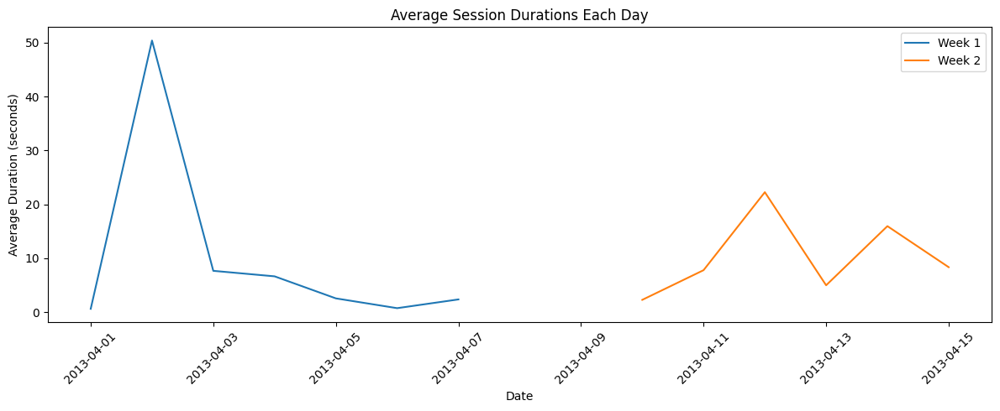

In [ ]:
# Average session duration for each day in Week 1 and 2

# Extract the date from 'parsedDate' for both weeks
week1_nf['Date'] = week1_nf['parsedDate'].dt.date
week2_nf['Date'] = week2_nf['parsedDate'].dt.date


# Group data for week 1 by 'Date' and calculate the mean session duration for each day
average_durations_week1 = week1_nf.groupby('Date')['durationSeconds'].mean()


# Group data for week 2 by 'Date' and calculate the mean session duration for each day
average_durations_week2 = week2_nf.groupby('Date')['durationSeconds'].mean()


# Create a line plot for the average session durations for week 1
plt.figure(figsize=(12, 5))
plt.plot(average_durations_week1.index, average_durations_week1.values, label='Week 1')
plt.plot(average_durations_week2.index, average_durations_week2.values, label='Week 2')
plt.title('Average Session Durations Each Day')
plt.xlabel('Date')
plt.ylabel('Average Duration (seconds)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

There is a gap in data between Week 1 and Week 2 from 4/7 to 4/10 due to Big Marketing's network being down while an Intrusion Prevention System (IPS) was installed for heightened security.


Starting at 4/2, shorter session durations occur due to denial of service attacks and malicious code causing infection to visiting computers.

In [132]:
# Hostname Usage Over Weeks 1 & 2

# Extract the date from 'parsedDate' for both weeks
week1_bb['Date'] = week1_bb['parsedDate'].dt.date
week2_bb['Date'] = week2_bb['parsedDate'].dt.date


# Concatenate data from both weeks
combined_data = pd.concat([week1_bb, week2_bb])


# Group the combined data by 'Date' and 'hostname' and count the occurrences
hostname_frequencies = combined_data.groupby(['Date', 'hostname']).size().reset_index(name='Frequency')


# Create a line graph to visualize the hostname frequencies over both weeks
fig = px.line(hostname_frequencies, x='Date', y='Frequency', color='hostname', title='Hostname Usage Over Week 1 & 2')


# Show the plot
fig.show()

From 4/2 to 4/5, www.bigmkt3.com experienced denial-of-service attacks that caused its server to crash. This can be shown by the steep drop in the frequency of web03.bigmkt3.com usage.


A previously unknown website, wss2-183.bigmkt2.com, appears on 4/5 and shows increases in traffic from 4/5 to 4/7 and 4/12 to 4/15. We believe that this may be the malicious website allowing for FTP exfiltration in Week 1 and DDOS attacks in Week 2.

# Analysis Using IPS (Intrusion Prevention System) Data

In [ ]:
# Combine week 1 and week 2 nf data and group by day to find the total number of flows per day
nf = pd.concat([week1_nf, week2_nf])
# reset index will create a newdataframe with parsedDate as a column instead of an index
# with name = 'totalFlows' will make the values from the original series named as 'totalFlows' column
nf = nf.groupby(nf['parsedDate'].dt.date).size().reset_index(name='totalFlows')

In [ ]:
nf

,parsedDate,totalFlows
0,2013-04-07 00:00:00,39229
1,2013-04-07 01:00:00,38007
2,2013-04-07 02:00:00,37987
3,2013-04-07 03:00:00,75927
4,2013-04-07 04:00:00,4251
...,...,...
91,2013-04-10 19:00:00,941
92,2013-04-10 20:00:00,923
93,2013-04-10 21:00:00,999
94,2013-04-10 22:00:00,1002


In [ ]:
# Import plotly express
import plotly.express as px
# Create an interactive bar chart to show the total number of flows per day
fig = px.bar(nf, x='parsedDate', y='totalFlows', title='Total Number of Flows per Day')
fig.show()


We can see the company's network is down for two full days. Let's investigate this furter by looking at a more close up view of the data.

In [ ]:
# Combine week 1 and week 2 nf data and group by day to find the total number of flows per day
nf = pd.concat([week1_nf, week2_nf])
# Include only date range between 2013-04-07 to 2013-04-10
nf = nf[(nf['parsedDate'] >= pd.to_datetime('2013-04-07')) & (nf['parsedDate'] <= pd.to_datetime('2013-04-11'))]
nf

,TimeSeconds,parsedDate,dateTimeStr,ipLayerProtocol,ipLayerProtocolCode,firstSeenSrcIp,firstSeenDestIp,firstSeenSrcPort,firstSeenDestPort,moreFragments,contFragments,durationSeconds,firstSeenSrcPayloadBytes,firstSeenDestPayloadBytes,firstSeenSrcTotalBytes,firstSeenDestTotalBytes,firstSeenSrcPacketCount,firstSeenDestPacketCount,recordForceOut
8802727,1.365293e+09,2013-04-07 00:01:36,2.013041e+13,6,TCP,10.9.81.5,172.10.0.4,62561,14966,0,0,0,0,0,58,0,1,0,0
8802728,1.365293e+09,2013-04-07 00:01:36,2.013041e+13,6,TCP,10.32.42.116,172.10.0.3,23219,25,0,0,10,94,479,534,865,8,7,0
8802729,1.365293e+09,2013-04-07 00:01:36,2.013041e+13,6,TCP,10.0.3.178,172.30.0.4,23268,80,0,0,0,197,5052,529,5384,6,6,0
8802730,1.365293e+09,2013-04-07 00:01:36,2.013041e+13,6,TCP,10.9.81.5,172.10.0.4,62560,14966,0,0,0,0,0,58,0,1,0,0
8802731,1.365293e+09,2013-04-07 00:01:36,2.013041e+13,6,TCP,10.9.81.5,172.10.0.5,62560,34174,0,0,0,0,0,58,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375156,1.365637e+09,2013-04-10 23:40:28,2.013041e+13,6,TCP,10.32.42.116,172.10.0.3,45082,25,0,0,10,1299,576,1901,1124,11,10,0
375157,1.365637e+09,2013-04-10 23:40:28,2.013041e+13,6,TCP,10.13.77.4,172.10.0.3,45085,25,0,0,10,1299,576,1901,1124,11,10,0
375158,1.365637e+09,2013-04-10 23:40:47,2.013041e+13,6,TCP,10.27.59.101,172.10.0.3,45114,25,0,0,10,1299,576,1901,1124,11,10,0
375159,1.365637e+09,2013-04-10 23:40:49,2.013041e+13,6,TCP,10.0.3.77,172.10.0.3,45117,25,0,0,10,1299,576,1901,1124,11,10,0


In [ ]:
# Now, we group the new nf by hour to find the total number of flows per minute
nf = nf.groupby([pd.Grouper(key='parsedDate', freq='H')]).size().reset_index(name='totalFlows')
nf

,parsedDate,totalFlows
0,2013-04-07 00:00:00,39229
1,2013-04-07 01:00:00,38007
2,2013-04-07 02:00:00,37987
3,2013-04-07 03:00:00,75927
4,2013-04-07 04:00:00,4251
...,...,...
91,2013-04-10 19:00:00,941
92,2013-04-10 20:00:00,923
93,2013-04-10 21:00:00,999
94,2013-04-10 22:00:00,1002


In [ ]:
# Graph the total number of flows per hour
fig = px.bar(nf, x='parsedDate', y='totalFlows', title='Total Number of Flows per Minute')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



We can see the network flow is down from 10 AM 04/07/2013 to 7 AM 04/10/2013. This is a total of 2 days and 21 hours for the installation of the IPS.

In [ ]:
week2_ips.head()

,dateTime,priority,operation,messageCode,protocol,SrcIp,destIp,srcPort,destPort,destService,direction,flags,command
0,2013-04-10 07:02:35,Info,Built,ASA-6-302013,TCP,172.10.2.35,10.1.0.75,2507,80,http,outbound,(empty),(empty)
1,2013-04-10 07:02:35,Info,Teardown,ASA-6-302014,TCP,172.30.1.104,10.0.0.14,2651,80,http,outbound,TCP FINs,(empty)
2,2013-04-10 07:02:35,Info,Teardown,ASA-6-302014,TCP,172.10.1.246,10.1.0.77,2504,80,http,outbound,TCP FINs,(empty)
3,2013-04-10 07:02:35,Info,Built,ASA-6-302013,TCP,172.10.1.138,10.1.0.100,1893,80,http,outbound,(empty),(empty)
4,2013-04-10 07:02:35,Info,Teardown,ASA-6-302014,TCP,172.10.1.203,10.1.0.77,2506,80,http,outbound,TCP FINs,(empty)


In [ ]:
# group_keys = False is to remove the multiindexing so we only group by the dateTime
# we then look for only the top 10 counts for each dateTime, hour in this case
# we then create a new dataframe by resetting the index and naming the values from the original series to 'counts'
week2_ips_top10 = week2_ips.groupby([pd.Grouper(key='dateTime', freq='H'), 'SrcIp']).size().groupby(level=0, group_keys=False).nlargest(10).reset_index(name='counts')

In [ ]:
week2_ips_top10 

,dateTime,SrcIp,counts
0,2013-04-10 07:00:00,172.20.0.3,5558
1,2013-04-10 07:00:00,172.30.0.3,4806
2,2013-04-10 07:00:00,172.10.0.3,3349
3,2013-04-10 07:00:00,172.10.2.135,648
4,2013-04-10 07:00:00,172.10.2.66,643
...,...,...,...
1228,2013-04-15 09:00:00,10.62.15.101,247
1229,2013-04-15 09:00:00,10.77.101.2,227
1230,2013-04-15 10:00:00,10.6.6.7,10
1231,2013-04-15 10:00:00,10.13.77.49,9


In [ ]:
# Create an interactive bar chart showing the data in week2_ips_top10. When hovering over the bars, it will show the dateTime, SrcIp, and counts.
import plotly.express as px
fig = px.bar(week2_ips_top10, x='dateTime', y='counts', color='SrcIp', hover_data=['dateTime', 'SrcIp', 'counts'])
# Change the title of the graph
fig.update_layout(title_text='Top 10 SrcIp per Hour')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/si

We can see signs of DDos attack on April 11, 2013 around 12 PM from multiple sources.

In [ ]:
# Download geoip2
!pip install geoip2

In [ ]:
import geoip2.database

# Load the GeoLite2 database
reader = geoip2.database.Reader('GeoLite2-Country.mmdb')

# Function to get country from IP
def get_country(ip):
    try:
        response = reader.country(ip)
        return response.country.iso_code
    except:
        return None

# Apply the function to the 'SrcIp' column
week2_ips_top10['Country'] = week2_ips_top10['SrcIp'].apply(get_country)

In [ ]:
# Download pycountry
!pip install pycountry

In [ ]:
import pycountry

# Function to convert ISO-2 to ISO-3
def convert_iso(iso2):
    try:
        return pycountry.countries.get(alpha_2=iso2).alpha_3
    except:
        return None

# Apply the function to the 'Country' column
week2_ips_top10['Country'] = week2_ips_top10['Country'].apply(convert_iso)

In [ ]:
# Create a choropleth map to show the top 10 SrcIp per hour
import plotly.express as px

fig = px.choropleth(week2_ips_top10, locations='Country', color='counts', hover_data=['dateTime', 'SrcIp', 'counts'], title='Top 10 SrcIp per Hour')
fig.show()

We can see all the traffic is coming from U.S. including the attacks.

In [ ]:
# Group the data by dateTime and destIP and find the top 10 destIP that has the most number of connections each hour
week2_ips_top10_dest = week2_ips.groupby([pd.Grouper(key='dateTime', freq='H'), 'destIp']).size().groupby(level=0, group_keys=False).nlargest(10).reset_index(name='counts')

In [ ]:
week2_ips_top10_dest

,dateTime,destIp,counts
0,2013-04-10 07:00:00,10.0.0.14,40796
1,2013-04-10 07:00:00,10.0.0.10,40667
2,2013-04-10 07:00:00,10.0.0.11,40596
3,2013-04-10 07:00:00,10.0.0.13,40569
4,2013-04-10 07:00:00,10.0.0.6,40487
...,...,...,...
1230,2013-04-15 10:00:00,10.0.2.2,8
1231,2013-04-15 10:00:00,10.0.3.2,7
1232,2013-04-15 10:00:00,172.10.0.2,2
1233,2013-04-15 10:00:00,172.20.0.15,2


In [ ]:
# Create an interactive bar chart showing the data in week2_ips_top10_dest. When hovering over the bars, it will show the dateTime, destIp, and counts.
import plotly.express as px
fig = px.bar(week2_ips_top10_dest, x='dateTime', y='counts', color='destIp', hover_data=['dateTime', 'destIp', 'counts'])
# Create a title
fig.update_layout(title_text='Top 10 destIp each hour in IPS for week 2')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/si

We can see DDoS attack in the for website 1, 2, and 3 happened on April 11, 2013 between around 12 PM. 

In [ ]:
# Get the top 10 destIps with the highest frequencies on just April 11, 2013
week2_ips_top10_dest[week2_ips_top10_dest['dateTime'] == '2013-04-11 00:00:00']

,dateTime,destIp,counts
170,2013-04-11,172.30.0.4,340
171,2013-04-11,172.20.0.3,278
172,2013-04-11,172.30.0.3,278
173,2013-04-11,172.10.0.3,277
174,2013-04-11,172.10.0.4,184
175,2013-04-11,172.20.0.4,136
176,2013-04-11,172.20.0.15,132
177,2013-04-11,172.30.0.5,10
178,2013-04-11,172.30.0.6,10
179,2013-04-11,172.10.0.7,8


We can see the attacks were all targeted against the company's servers, with ip ranges 172.10.0.0/16, 172.20.0.0/16, and 172.30.0.0/16

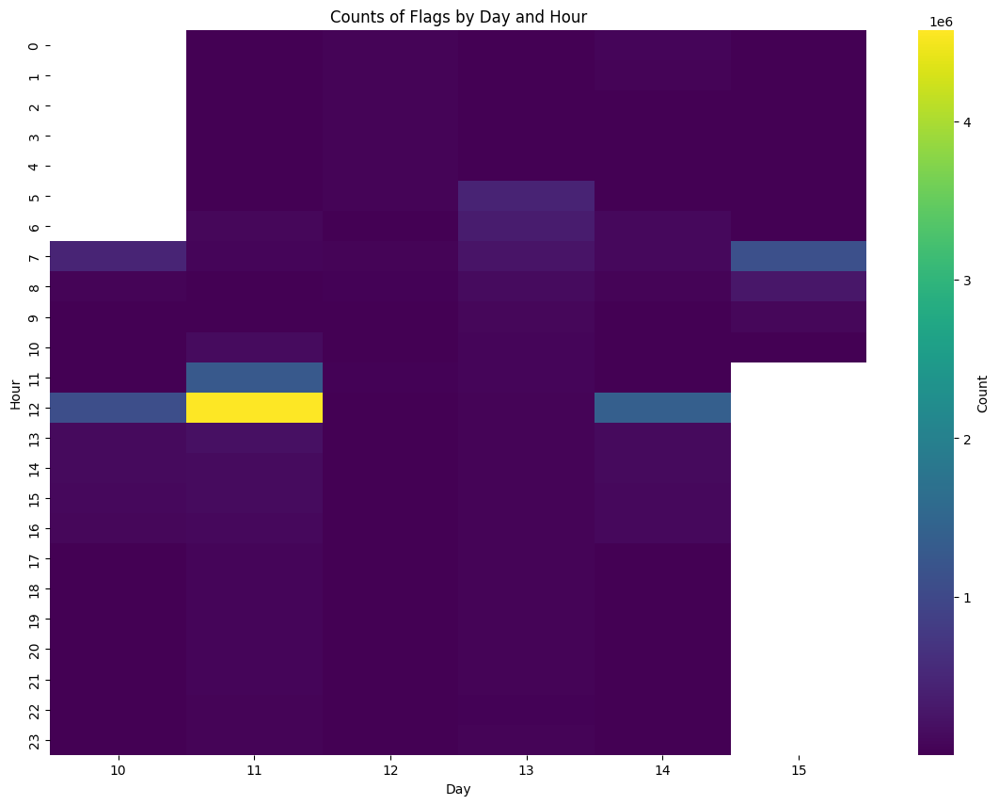

In [ ]:
# Filter out rows where 'operation' is empty
dfIPS_non_empty = week2_ips[week2_ips['operation'].notna()]

# Create new columns for 'year', 'month', 'day', 'hour', and 'minute'
dfIPS_non_empty['year'] = dfIPS_non_empty['dateTime'].dt.year
dfIPS_non_empty['month'] = dfIPS_non_empty['dateTime'].dt.month
dfIPS_non_empty['day'] = dfIPS_non_empty['dateTime'].dt.day
dfIPS_non_empty['hour'] = dfIPS_non_empty['dateTime'].dt.hour
dfIPS_non_empty['minute'] = dfIPS_non_empty['dateTime'].dt.minute

# Create a heatmap with Seaborn
plt.figure(figsize=(14, 10))

# Group by 'day', 'hour', and 'flags', then calculate counts
df_counts = dfIPS_non_empty.groupby(['day', 'hour', 'flags']).size().reset_index(name='count')

# Pivot the DataFrame to create a matrix for the heatmap
heatmap_data = df_counts.pivot_table(index='hour', columns='day', values='count', aggfunc='sum')

# Set y-axis to be in ascending order
heatmap_data = heatmap_data.sort_index(ascending=True)

# Create the heatmap
sns.heatmap(heatmap_data, cmap='viridis', cbar_kws={'label': 'Count'})

plt.xlabel('Day')
plt.ylabel('Hour')
plt.title('Counts of Flags by Day and Hour')
plt.show()


The number of flags supports the DDoS attack evidence found in prior steps, with extremely high number of flags on April 11, 2013 around 12 PM.

In [ ]:
# Look at the most common messageCode for each hour
week2_ips_top10_msg = week2_ips.groupby([pd.Grouper(key='dateTime', freq='H'), 'messageCode']).size().groupby(level=0, group_keys=False).nlargest(10).reset_index(name='counts')

In [ ]:
week2_ips_top10_msg

,dateTime,messageCode,counts
0,2013-04-10 07:00:00,ASA-6-302013,243366
1,2013-04-10 07:00:00,ASA-6-302014,216056
2,2013-04-10 07:00:00,ASA-6-106015,1243
3,2013-04-10 07:00:00,ASA-6-302015,1
4,2013-04-10 07:00:00,ASA-6-302016,1
...,...,...,...
343,2013-04-15 09:00:00,ASA-6-302014,7657
344,2013-04-15 09:00:00,ASA-6-302013,7644
345,2013-04-15 10:00:00,ASA-4-106023,15
346,2013-04-15 10:00:00,ASA-6-302013,3


In [ ]:
# Graph the data in week2_ips_top10_msg
import plotly.express as px
fig = px.bar(week2_ips_top10_msg, x='dateTime', y='counts', color='messageCode', hover_data=['dateTime', 'messageCode', 'counts'])
# Create a title
fig.update_layout(title_text='Top 10 messageCode each hour in IPS for week 2')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/si

We can see burst of message code ASA-6-302013 (3.5M) and ASA-6-302014 (800.5K) happened on April 11, 2013 between around 12 PM.

ASA-6-302013 and ASA-6-302014 correspond to building and tearing down of TCP connection. The sudden increase in these messages indicate a sudden increase in TCP connections, which is a sign of DDoS attack.


In [ ]:
# Let's take a closer look at each minute between 2013-04-11 11:00:00 and 2013-04-11 13:00:00
# Filter to only include that time range and group by minute
week2_ips_top10_msg_minute = week2_ips[(week2_ips['dateTime'] >= pd.to_datetime('2013-04-11 11:00:00')) & (week2_ips['dateTime'] <= pd.to_datetime('2013-04-11 13:00:00'))]
week2_ips_top10_msg_minute = week2_ips_top10_msg_minute.groupby([pd.Grouper(key='dateTime', freq='Min'), 'messageCode']).size().groupby(level=0, group_keys=False).nlargest(10).reset_index(name='counts')
week2_ips_top10_msg_minute


,dateTime,messageCode,counts
0,2013-04-11 11:00:00,ASA-4-106023,6953
1,2013-04-11 11:00:00,ASA-6-302013,241
2,2013-04-11 11:00:00,ASA-6-302014,236
3,2013-04-11 11:01:00,ASA-4-106023,5094
4,2013-04-11 11:01:00,ASA-6-302013,223
...,...,...,...
418,2013-04-11 12:59:00,ASA-6-302013,240
419,2013-04-11 13:00:00,ASA-4-106023,30
420,2013-04-11 13:00:00,ASA-6-106015,5
421,2013-04-11 13:00:00,ASA-6-302013,2


In [ ]:
# Graph the data in week2_ips_top10_msg_minute
import plotly.express as px
fig = px.bar(week2_ips_top10_msg_minute, x='dateTime', y='counts', color='messageCode', hover_data=['dateTime', 'messageCode', 'counts'])
# Create a title
fig.update_layout(title_text='Top 10 messageCode each minute between 2013-04-11 11:00:00 and 2013-04-11 13:00:00')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.9/si

We can see specifically, the DDoS attack started to happen around 11:56 AM on April 11, 2013, and ended around 12:58 PM on April 11, 2013.

In [ ]:
import networkx as nx
import plotly.graph_objects as go


week2_ips

# Filter for 04-12-2013 between 12 and 12:30 pm, since that is when the DDos attack happened for week 2
dfIPSH1 = week2_ips[(week2_ips['dateTime'] >= pd.to_datetime('2013-04-12 12:00:00')) & (week2_ips['dateTime'] <= pd.to_datetime('2013-04-12 12:30:00'))]


# Create a directed graph
G = nx.from_pandas_edgelist(dfIPSH1, 'srcPort', 'destPort', create_using=nx.DiGraph())

# Position nodes using spring layout
pos = nx.spring_layout(G)

# Create edge traces
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node traces
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        )
    )
)

# Add hover text to each node
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append(f'Port: {node}<br># of connections: {len(adjacencies[1])}')

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

# Create the plot
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0, l=0, r=0, t=0),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

# Add a title
fig.update_layout(title_text='Connections Between Ports in IPS at 12 PM on 04-12-2013')
# Show the interactive plot
fig.show()

We can see when looking at the connection between source and destination ports during the week 2 DDoS attack, the most used ports are ports 2, 4, and 6 which are used for TCP and UDP connections. We can see most of the attacks were indeed through TCP connections as shown earlier by message codes ASA-6-302013 and ASA-6-302014.

In [134]:
# See the frequency of the number of unique destPort being each hour
week2_num_ports_in_use = week2_ips.groupby([pd.Grouper(key='dateTime', freq='H')])['destPort'].nunique()

week2_num_ports_in_use

dateTime
2013-04-10 07:00:00      825
2013-04-10 08:00:00      114
2013-04-10 09:00:00       24
2013-04-10 10:00:00       19
2013-04-10 11:00:00       14
                       ...  
2013-04-15 06:00:00        3
2013-04-15 07:00:00    65535
2013-04-15 08:00:00    51445
2013-04-15 09:00:00    26599
2013-04-15 10:00:00       11
Freq: H, Name: destPort, Length: 124, dtype: int64

In [135]:
# Graph the data in week2_num_ports_in_use
import plotly.express as px
fig = px.bar(week2_num_ports_in_use, x=week2_num_ports_in_use.index, y='destPort', title='Number of Unique destPort each hour')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



We can see potential port scans being done at 04/10/2013 around 12 PM.

We can see potential port scans being done at 04/11/2013 around 11 AM to 12 PM.

We can see potential port scans being done at 04/12/2013 around 11 AM.

We can see potential port scans being done at 04/13/2013 around 5 AM to 6 AM.

We can see potential port scans being done at 04/14/2013 around 12 PM.

We can see potential port scans being done at 04/15/2013 around 7 AM.

In [ ]:
# Now lets look at the top port numbers used in week 2
week2_top_ports = week2_ips.groupby('destPort').size().nlargest(10).reset_index(name='counts')
week2_top_ports

,destPort,counts
0,80,5769392
1,3389,557829
2,25,194902
3,22,6855
4,37782,233
5,37802,233
6,37801,225
7,37577,223
8,37595,223
9,37762,223


In [ ]:
# Look at the freqeuncy of Port 80 being used each hour
week2_port80 = week2_ips[week2_ips['destPort'] == 80].groupby([pd.Grouper(key='dateTime', freq='H')]).size().reset_index(name='counts')

# Graph the data in week2_port80
import plotly.express as px
fig = px.bar(week2_port80, x='dateTime', y='counts', title='Port 80 being used each hour')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



As expected, we can see surge in use of port 80 (HTTP) during the DDoS attack.

In [ ]:
# Look at the freqeuncy of Port 3389 being used each hour
week2_port3389 = week2_ips[week2_ips['destPort'] == 3389].groupby([pd.Grouper(key='dateTime', freq='H')]).size().reset_index(name='counts')

# Graph the data in week2_port3389
import plotly.express as px
fig = px.bar(week2_port3389, x='dateTime', y='counts', title='Port 3389 being used each hour')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



As expected, we see surge in use of port 443 (HTTPS) during the port scan that happened around 12 PM on 04-10-2013.

In [ ]:
# Look at the freqeuncy of Port 25 being used each hour
week2_port25 = week2_ips[week2_ips['destPort'] == 25].groupby([pd.Grouper(key='dateTime', freq='H')]).size().reset_index(name='counts')\

# Graph the data in week2_port25
import plotly.express as px
fig = px.bar(week2_port25, x='dateTime', y='counts', title='Port 25 being used each hour')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



As expected, we can see surge in use of port 25 (SMTP) during the port scan around around 12 PM on 04-10-2013.

In [ ]:
# Now let's look at the frequency of detPort 22 being used each hour, since it is common for attackers to use port 22 for attack
week2_port22_in_use = week2_ips[week2_ips['destPort'] == 22].groupby([pd.Grouper(key='dateTime', freq='H')])['destPort'].count()

# Plot the data in week2_port22_in_use
import plotly.express as px

fig = px.bar(week2_port22_in_use, x=week2_port22_in_use.index, y='destPort', title='Number of times destPort 22 is used each hour')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



We can see sudden use of port 22 (SSH) during the port scan around 12 PM on 04-10-2013.
We can see sudden continuous use of port 22 (SSH) from 04-12-2013 8 AM and onwards, suggesting potential Botnet activity.

In [ ]:
# Look only at data for 04-12-2013 from 8am to 10am to take a closer look at the frequency of destPort 22 being used
week2_port22_in_use = week2_ips[(week2_ips['dateTime'] >= pd.to_datetime('2013-04-12 08:00:00')) & (week2_ips['dateTime'] <= pd.to_datetime('2013-04-12 10:00:00'))]

# Group the data by minute and count the number of times destPort 22 is used
week2_port22_in_use = week2_port22_in_use[week2_port22_in_use['destPort'] == 22].groupby([pd.Grouper(key='dateTime', freq='Min')])['destPort'].count()

# Plot the data in week2_port22_in_use
fig = px.bar(week2_port22_in_use, x=week2_port22_in_use.index, y='destPort', title='Number of times destPort 22 is used each minute')
fig.update_yaxes(title_text='Number of Port 22 in Use')
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



We can see the botnet causes the servers to attack other end-points via SSH (Port 22) every 10 minutes.